<a href="https://colab.research.google.com/github/kjindal19/Agricure.tech/blob/master/Preprocessing_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import glob

# Load reference image
ref_img = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/reference.png', cv2.IMREAD_GRAYSCALE)

# Preprocess reference image
ref_img = cv2.GaussianBlur(ref_img, (5,5), 0)

# Define keypoint detector
orb = cv2.ORB_create()

# Define feature extractor
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Define minimum matches required to consider a positive match
MIN_MATCH_COUNT = 10


In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:

# Load training images and their corresponding exposure settings
train_imgs = []
exposure_settings = []
for file in glob.glob(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/Train/*.jpg'):
    img = cv2.imread(file, cv2.IMREAD_GRAYSCALE)
    # Preprocess training image
    img = cv2.GaussianBlur(img, (5,5), 0)
    train_imgs.append(img)
    # Extract exposure setting from filename
    exposure_settings.append(float(file.split('_')[1][:-4]))





In [ ]:
# Find keypoints and descriptors for reference image
kp_ref, des_ref = orb.detectAndCompute(ref_img, None)

# Initialize dictionary for storing matches for each training image
matches_dict = {}


In [ ]:

# Loop over training images
for i in range(len(train_imgs)):
    # Find keypoints and descriptors for training image
    kp_train, des_train = orb.detectAndCompute(train_imgs[i], None)
    
    # Match features
    matches = bf.match(des_ref, des_train)
    
    # Sort matches by distance
    matches = sorted(matches, key=lambda x:x.distance)
    
    # Filter matches by distance
    good_matches = [m for m in matches if m.distance < 2.5 * MIN_MATCH_COUNT]
    print(good_matches)
    
    # Store good matches for this training image in dictionary
    matches_dict[i] = good_matches

[< cv2.DMatch 0x7f3185905d50>, < cv2.DMatch 0x7f3185906290>, < cv2.DMatch 0x7f3185907750>, < cv2.DMatch 0x7f317ff901f0>, < cv2.DMatch 0x7f3185906c90>, < cv2.DMatch 0x7f317ff905f0>, < cv2.DMatch 0x7f3185906570>, < cv2.DMatch 0x7f3185907cd0>, < cv2.DMatch 0x7f317ff90570>]
[< cv2.DMatch 0x7f3185907090>, < cv2.DMatch 0x7f3185905050>, < cv2.DMatch 0x7f31859068d0>, < cv2.DMatch 0x7f3185906a70>]
[< cv2.DMatch 0x7f3185bd4630>, < cv2.DMatch 0x7f3185905bd0>]
[< cv2.DMatch 0x7f3185906030>, < cv2.DMatch 0x7f3185907470>, < cv2.DMatch 0x7f3185905350>, < cv2.DMatch 0x7f3185905c70>, < cv2.DMatch 0x7f3185906c30>, < cv2.DMatch 0x7f3185907bd0>, < cv2.DMatch 0x7f3185906db0>]
[< cv2.DMatch 0x7f31859059f0>, < cv2.DMatch 0x7f3185905cb0>, < cv2.DMatch 0x7f3185bd4450>, < cv2.DMatch 0x7f317ff90950>, < cv2.DMatch 0x7f3185907e50>, < cv2.DMatch 0x7f3185907730>, < cv2.DMatch 0x7f3185907410>, < cv2.DMatch 0x7f3185907330>, < cv2.DMatch 0x7f3185907870>, < cv2.DMatch 0x7f317ff90a90>, < cv2.DMatch 0x7f3185906a90>, < cv2

In [ ]:
# Calculate weighted average exposure setting
total_weight = sum([len(matches_dict[i]) for i in range(len(train_imgs))])
print(matches_dict)
weighted_exposure = sum([exposure_settings[i] * len(matches_dict[i]) / total_weight for i in range(len(train_imgs))])

# Print weighted average exposure setting
print('Weighted average exposure setting: {:.2f}'.format(weighted_exposure))

# Initialize list of homography matrices
homography_matrices = []

# Loop over training images
for i in range(len(train_imgs)):
    # Get good matches for this training image
    good_matches = matches_dict[i]
    print(len(good_matches))
    
    # Check if there are enough matches to consider a positive match
    if len(good_matches) >= MIN_MATCH_COUNT:
        # Extract keypoints for reference and training images
        src_pts = np.float32([ kp_ref[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp_train[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
        
        # Calculate homography matrix using RANSAC algorithm
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
        
        # Store homography matrix for this training image
        homography_matrices.append(M)



{0: [< cv2.DMatch 0x7f3185905d50>, < cv2.DMatch 0x7f3185906290>, < cv2.DMatch 0x7f3185907750>, < cv2.DMatch 0x7f317ff901f0>, < cv2.DMatch 0x7f3185906c90>, < cv2.DMatch 0x7f317ff905f0>, < cv2.DMatch 0x7f3185906570>, < cv2.DMatch 0x7f3185907cd0>, < cv2.DMatch 0x7f317ff90570>], 1: [< cv2.DMatch 0x7f3185907090>, < cv2.DMatch 0x7f3185905050>, < cv2.DMatch 0x7f31859068d0>, < cv2.DMatch 0x7f3185906a70>], 2: [< cv2.DMatch 0x7f3185bd4630>, < cv2.DMatch 0x7f3185905bd0>], 3: [< cv2.DMatch 0x7f3185906030>, < cv2.DMatch 0x7f3185907470>, < cv2.DMatch 0x7f3185905350>, < cv2.DMatch 0x7f3185905c70>, < cv2.DMatch 0x7f3185906c30>, < cv2.DMatch 0x7f3185907bd0>, < cv2.DMatch 0x7f3185906db0>], 4: [< cv2.DMatch 0x7f31859059f0>, < cv2.DMatch 0x7f3185905cb0>, < cv2.DMatch 0x7f3185bd4450>, < cv2.DMatch 0x7f317ff90950>, < cv2.DMatch 0x7f3185907e50>, < cv2.DMatch 0x7f3185907730>, < cv2.DMatch 0x7f3185907410>, < cv2.DMatch 0x7f3185907330>, < cv2.DMatch 0x7f3185907870>, < cv2.DMatch 0x7f317ff90a90>, < cv2.DMatch 0x

In [ ]:
# Calculate average homography matrix
avg_homography_matrix = np.mean(homography_matrices, axis=0)

print(avg_homography_matrix)
# Save model
np.save(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/model.npy', avg_homography_matrix)

[[ 6.87593194e-01 -6.31106888e+00  3.83292769e+03]
 [ 9.94375329e-01 -5.80581791e+00  3.19861011e+03]
 [ 2.94771843e-04 -1.77861453e-03  1.00000000e+00]]


In [ ]:
import cv2
import numpy as np

# load pre-trained model
model = np.load(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/model.npy', allow_pickle=True)
print(model)


# read input image
img = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/input.jpg')

# resize input image to match reference image size

print(model)
img = cv2.resize(img, model['ref_size'])

# adjust exposure of input image to match reference image
mean_ref = np.mean(model['ref_img'])
mean_input = np.mean(img)
ratio = mean_ref / mean_input
img = np.uint8(np.clip(img * ratio, 0, 255))

# apply pre-processing and registration
processed_img = model['preprocess'](img)
registered_img = model['register'](processed_img)

# save output image
cv2.imwrite(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/output.jpg', registered_img)

[[ 6.87593194e-01 -6.31106888e+00  3.83292769e+03]
 [ 9.94375329e-01 -5.80581791e+00  3.19861011e+03]
 [ 2.94771843e-04 -1.77861453e-03  1.00000000e+00]]
[[ 6.87593194e-01 -6.31106888e+00  3.83292769e+03]
 [ 9.94375329e-01 -5.80581791e+00  3.19861011e+03]
 [ 2.94771843e-04 -1.77861453e-03  1.00000000e+00]]


IndexError: ignored

# New Approach

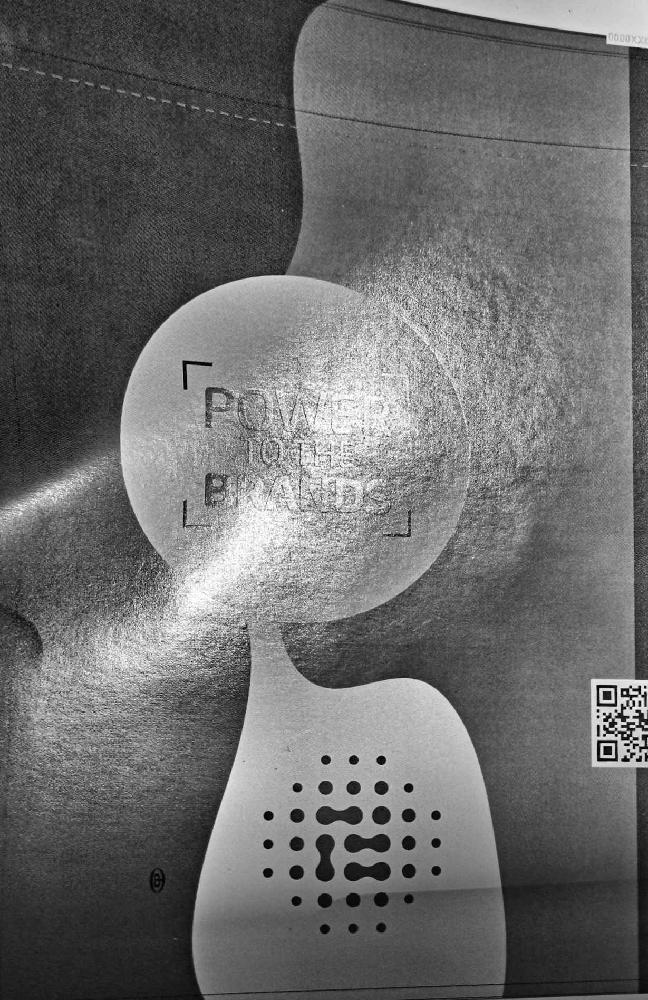

True

In [ ]:
import cv2
import numpy as np

# Load reference and input images
ref = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/reference.png', cv2.IMREAD_GRAYSCALE)
inp = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/input.JPG', cv2.IMREAD_GRAYSCALE)



# Resize input image to the same size as reference image
inp = cv2.resize(inp, ref.shape[::-1])

# Perform exposure and lighting adjustment
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
inp = clahe.apply(inp)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find keypoints and descriptors in reference image and input image
kp1, des1 = sift.detectAndCompute(ref, None)
kp2, des2 = sift.detectAndCompute(inp, None)

# Initialize FLANN matcher
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict()
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Match keypoints and descriptors in reference image and input image
matches = flann.knnMatch(des1, des2, k=2)

# Apply ratio test to select good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Compute homography matrix using RANSAC algorithm
if len(good_matches) > 10:
    ref_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    inp_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    H, _ = cv2.findHomography(inp_pts, ref_pts, cv2.RANSAC, 5.0)
else:
    H = np.eye(3)

# Apply homography matrix to input image
out = cv2.warpPerspective(inp, H, ref.shape[::-1])

cv2_imshow(out)

# Save the output image
cv2.imwrite(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/output.jpg', out)

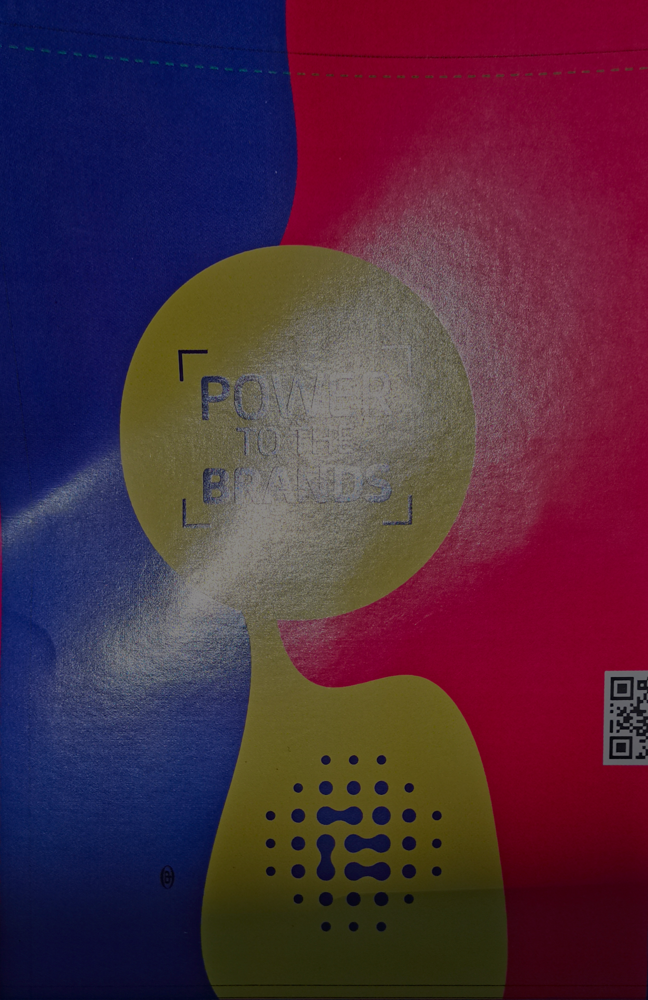

In [ ]:
import cv2
import numpy as np

# Load the reference and input images
ref_img  = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/reference.png')
input_img = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/input.JPG')


def preprocess_image(input_img, ref_img):
    # Convert input and reference images to LAB color space
    input_lab = cv2.cvtColor(input_img, cv2.COLOR_BGR2LAB)
    ref_lab = cv2.cvtColor(ref_img, cv2.COLOR_BGR2LAB)

    # Scale L channel of input image to match the reference image
    input_l, input_a, input_b = cv2.split(input_lab)
    ref_l, ref_a, ref_b = cv2.split(ref_lab)
    scale = (np.max(ref_l) - np.min(ref_l)) / (np.max(input_l) - np.min(input_l))
    input_l = cv2.convertScaleAbs(input_l, alpha=scale, beta=0)

    # Merge the modified L channel with the original A and B channels
    input_lab = cv2.merge((input_l, input_a, input_b))

    # Convert input image back to BGR color space
    input_img = cv2.cvtColor(input_lab, cv2.COLOR_LAB2BGR)
    input_img = cv2.convertScaleAbs(input_img)

    # Convert input and reference images to grayscale
    input_gray = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
    ref_gray = cv2.cvtColor(ref_img, cv2.COLOR_BGR2GRAY)

    # Create SIFT object
    sift = cv2.SIFT_create()

    # Detect keypoints and compute descriptors for input and reference images
    kp1, des1 = sift.detectAndCompute(input_gray, None)
    kp2, des2 = sift.detectAndCompute(ref_gray, None)

    # Match keypoints in input and reference images
    matcher = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict())
    matches = matcher.knnMatch(des1, des2, k=2)

    # Apply Lowe's ratio test to select good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

    # Perform image registration using RANSAC
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    registered_img = cv2.warpPerspective(input_img, M, (ref_img.shape[1], ref_img.shape[0]))

    return registered_img
    

# Preprocess input image to match reference image
result_img = preprocess_image(input_img, ref_img)

# Save result image
cv2_imshow(result_img)

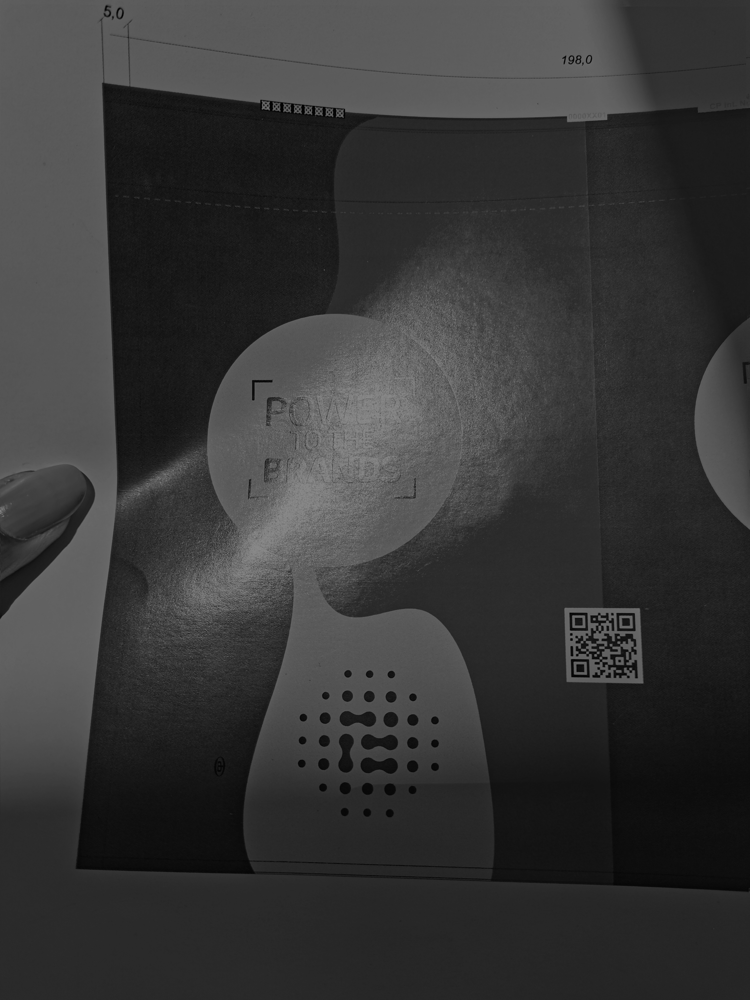

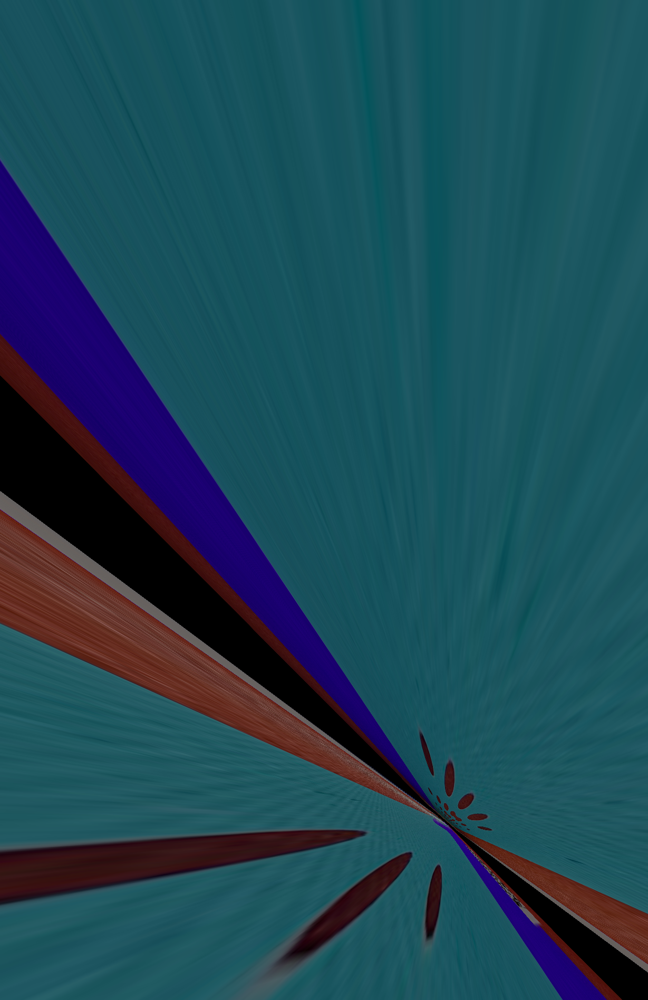

In [ ]:
import cv2
import numpy as np



def register_images(ref_img, input_img):
    # Preprocess input image using AHE
    # Convert input and reference images to LAB color space
    input_lab = cv2.cvtColor(input_img, cv2.COLOR_BGR2LAB)
    ref_lab = cv2.cvtColor(ref_img, cv2.COLOR_BGR2LAB)

    # Scale L channel of input image to match the reference image
    input_l, input_a, input_b = cv2.split(input_lab)
    ref_l, ref_a, ref_b = cv2.split(ref_lab)
    scale = (np.max(ref_l) - np.min(ref_l)) / (np.max(input_l) - np.min(input_l))
    input_l = cv2.convertScaleAbs(input_l, alpha=scale, beta=0)

    # Merge the modified L channel with the original A and B channels
    input_lab = cv2.merge((input_l, input_a, input_b))

    # Convert input image back to BGR color space
    input_img = cv2.cvtColor(input_lab, cv2.COLOR_LAB2BGR)

    # Convert input and reference images to grayscale
    ref_gray = cv2.cvtColor(ref_img, cv2.COLOR_BGR2GRAY)
    input_gray = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
    cv2_imshow(input_gray)

    # Initialize SIFT detector and descriptor
    sift = cv2.SIFT_create()

    # Find keypoints and descriptors for reference and input images
    ref_kp, ref_desc = sift.detectAndCompute(ref_gray, None)
    input_kp, input_desc = sift.detectAndCompute(input_gray, None)

    # Create brute-force matcher and match keypoints
    bf = cv2.BFMatcher()
    matches = bf.match(ref_desc, input_desc)

    # Sort matches by distance
    matches = sorted(matches, key=lambda x: x.distance)

    # Get top N matches
    N = 50
    good_matches = matches[:N]

    # Extract coordinates of matched keypoints in both images
    ref_pts = np.float32([ref_kp[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    input_pts = np.float32([input_kp[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # Find homography matrix
    homography, _ = cv2.findHomography(input_pts, ref_pts, cv2.RANSAC)

    # Apply homography matrix to input image
    registered = cv2.warpPerspective(input_img, homography, (ref_img.shape[1], ref_img.shape[0]))

    # Convert back to BGR color space
    registered = cv2.cvtColor(registered, cv2.COLOR_BGR2RGB)

    return registered


if __name__ == '__main__':
    # Load reference and input images

    ref_img  = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/reference.png')
    input_img = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/input.JPG')



    # Register images
    registered = register_images(ref_img, input_img)

    cv2_imshow(registered)


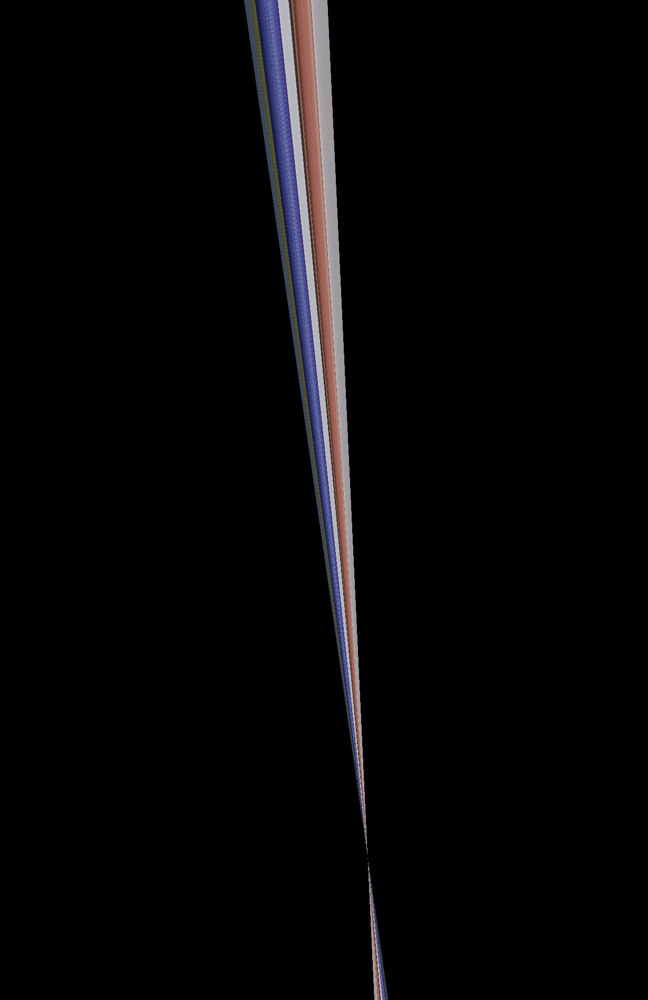

In [ ]:
import cv2
import numpy as np

def preprocess_ahe(img):
    # Convert input image to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    # Split L, A, and B channels
    l, a, b = cv2.split(lab)

    # Apply adaptive histogram equalization (AHE) to L channel
    clahe = cv2.createCLAHE(clipLimit=0.1, tileGridSize=(8,8))
    l = clahe.apply(l)

    # Merge L, A, and B channels back into LAB image
    lab = cv2.merge((l, a, b))

    # Convert back to BGR color space
    return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)


def register_images(ref_img, input_img):
    # Preprocess input image using AHE
    input_img = preprocess_ahe(input_img)
    input_img = cv2.convertScaleAbs(input_img)

    # Convert input and reference images to grayscale
    input_gray = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
    ref_gray = cv2.cvtColor(ref_img, cv2.COLOR_BGR2GRAY)

    # Create SIFT object
    sift = cv2.SIFT_create()

    # Detect keypoints and compute descriptors for input and reference images
    kp1, des1 = sift.detectAndCompute(input_gray, None)
    kp2, des2 = sift.detectAndCompute(ref_gray, None)

    # Match keypoints in input and reference images
    matcher = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict())
    matches = matcher.knnMatch(des1, des2, k=2)

    # Apply Lowe's ratio test to select good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 2.5 * n.distance:
            good_matches.append(m)

    # Perform image registration using RANSAC
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    registered_img = cv2.warpPerspective(input_img, M, (ref_img.shape[1], ref_img.shape[0]))

    return registered_img


if __name__ == '__main__':
    # Load reference and input images

    ref_img  = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/reference.png')
    input_img = cv2.imread(r'/content/drive/MyDrive/Colab Notebooks/Ennovate Coding Challenge/input.JPG')



    # Register images
    registered = register_images(ref_img, input_img)

    cv2_imshow(registered)
